FINA6289

Individual Assignment

Tsan Sum Lee

I changed the correlation calculation in this program to Spearman's. Pearson Correlation presumes the relationship between two continuous variables should be linear and both of the variables are normal distributed. There is no evidence shows that the relationship of any pairs of companies'stock prices must be linear. Apparently, stock prices have a trait of non-linearlity. Using Spearman Correlation is more appropriate in the use cases relating to stock prices, as there is no presumption made on the relationship and it has robustness against outliers and non-normality. It can effectively capture monotonic relationships, whether linear or not.

Pair strategy is a type of **relative value** strategies or **statistical arbitrage**
which rely on the **mean-reversion** of prices to the asset's fair value.
They assume that prices only temporarily move away from fair value due to behavioral effects
like overreaction or herding, or liquidity effects such as temporary market impact or long-term supply/demand friction.



*   Find the price **correlated** HK stocks in **same sector** for Pair strategy
*   Buy the stock when it is relatively **under-priced** to the correlated stock and sell the corresponding **over-priced** stock
*   As they're price correlated (statistically), assume they will go back to the similar price ratio later (mean reversion)
*   Hence (hopefully), the under-priced stock (bought) will goes up later while the over-priced (sold) one will drop


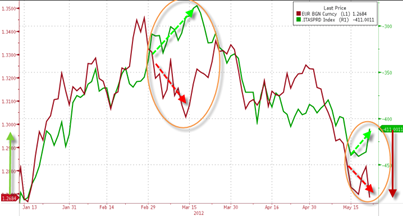

In [ ]:
#@title Choose the language to display the stock names and run this block to import libraries and helper functions
language = 'Chinese' #@param ["English", "Chinese"]

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)

from datetime import datetime
import numpy as np
import pandas as pd
import pandas_datareader.data as web

# Download the font to display Chinese
!wget https://github.com/kenwkliu/ideas/raw/master/colab/data/simhei.ttf
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
CNFont = FontProperties(fname='/content/simhei.ttf')
%matplotlib inline

# Yahoo Finance
import yfinance as yf

# Enable Google interactive table
from google.colab import data_table
data_table.enable_dataframe_formatter()

import ipywidgets as widgets
from IPython.display import display, clear_output


# 20220202: Temp workaround for the pandas upgrade
# !pip install --upgrade openpyxl

### Helper functions
# Display the stock info in Chinese or not
def useChinese(use=True):
  # return STOCK_INFO_FILE, RESEARCH_AJD_CLOSE_FILE, TEST_AJD_CLOSE_FILE
  if use:
    return 'hkStocksQuotesChi.xlsx', 'researchHKStocksAdjClosePxChi.csv', 'testHKStocksAdjClosePxChi.csv'

  else:
    return 'hkStocksQuotes.xlsx', 'researchHKStocksAdjClosePx.csv', 'testHKStocksAdjClosePx.csv'


STOCK_INFO_FILE, RESEARCH_AJD_CLOSE_FILE, TEST_AJD_CLOSE_FILE = useChinese(False)

CHART_SIZE_X, CHART_SIZE_Y = 12, 8
SMALL_CHART_SIZE_X, SMALL_CHART_SIZE_Y = 8, 6


# Plot stock pair chart
def plotPair(df, stockA, stockB, sizeX, sizeY):
  ax1 = df[stockA].plot(label=stockA, legend=True, figsize = (sizeX, sizeY))
  ax1.set_ylim(df[stockA].min(), df[stockA].max())

  ax2 = df[stockB].plot(secondary_y=True, label=stockB, legend=True, figsize = (sizeX, sizeY))
  ax2.set_ylim(df[stockB].min(), df[stockB].max())

  ax1.legend(prop=CNFont, loc=2)
  ax2.legend(prop=CNFont, loc=1)

  plt.show()


# Filter the correlated stock pairs with the THRESHOLD
def getCorrelatedPairs(stocksCorr, THRESHOLD=0.95):
  # filter the pairs with correlation values above the THRESHOLD
  highCorr = stocksCorr[((stocksCorr >= THRESHOLD) & (stocksCorr < 1))]
  highCorr = highCorr.unstack().sort_values(ascending=False).drop_duplicates()
  highCorr.dropna(inplace=True)
  highCorrDf = highCorr.to_frame().reset_index()
  highCorrDf.rename(columns = {'level_0':'stockA', 'level_1':'stockB', 0:'corr'}, inplace=True)

  # looks up the sectors for the stocksA and stockB
  cols = ['stockA', 'stockB', 'corr', 'sector_A', 'sector_B']
  pairsDf = highCorrDf.merge(stocksFilteredInfo[['shortName', 'sector']], how='left', left_on='stockA', right_on='shortName').merge(stocksFilteredInfo[['shortName', 'sector']], how='left', left_on='stockB', right_on='shortName', suffixes=('_A', '_B'))[cols]
  pairsDf['sameSector'] = (pairsDf['sector_A'] == pairsDf['sector_B'])

  return pairsDf


### back test related functions

# based on the reserch data to determind the trading params (Enter/Exit Points)
def researchTradingParams(researchData, stockA, stockB, threshold=0.05):
  tradingParams = {}
  cols = [stockA, stockB]
  research_df = researchData[cols].copy()
  research_df.dropna(inplace = True)

  # Calculate avgPxRatio for Exit (convergence)
  research_df['ratio'] = research_df[stockA] / research_df[stockB]
  avgPxRatio = research_df['ratio'].mean()
  tradingParams['avgPxRatio'] = avgPxRatio

  # Calculate shortA_longB_ratio for Entry (Divergence)
  shortA_longB_ratio = avgPxRatio * (1 + threshold)
  tradingParams['shortA_longB_ratio'] = shortA_longB_ratio

  # Calculate longA_shortB_ratio from Entry (Divergence)
  longA_shortB_ratio = avgPxRatio * (1 - threshold)
  tradingParams['longA_shortB_ratio'] = longA_shortB_ratio

  return tradingParams


# Determind the signal and dollarValue in the test data
# Currently one dollarValue will be used for all the trade
# Future improvement can adjust the dollarValue per entry signals
# signal == -1: Long stockA Short stockB
# signal == 1: Short stockA Long stockB
# signal == 0: flat position
def backTest(testData, tradingParams, stockA, stockB, dollarValue=10000, stopLoss=0):
  cols = [stockA, stockB]
  backTest_df = testData[cols].copy()
  backTest_df.dropna(inplace = True)

  # Get the tradingParams
  avgPxRatio = tradingParams['avgPxRatio']
  shortA_longB_ratio = tradingParams['shortA_longB_ratio']
  longA_shortB_ratio = tradingParams['longA_shortB_ratio']

  # Calc the stopLoss value
  if stopLoss > 0:
    stopLossUp = shortA_longB_ratio * (1 + stopLoss)
    stopLossDown = longA_shortB_ratio * (1 - stopLoss)

  # Calculate the Price ratio in backTest_df
  backTest_df['pxRatio'] = backTest_df[stockA] / backTest_df[stockB]
  backTest_df['dollarValue'] = dollarValue #one dollarValue will be used for all the trade

  # initialize the signal to 0
  backTest_df['signal'] = 0
  signal = 0

  # Determine the signal in each row of the backTest_df
  for index, row in backTest_df.iterrows():
    pxRatio = row['pxRatio']

    # If hit the stopLoss, will exit the trade entirely
    if stopLoss > 0 and (pxRatio > stopLossUp or pxRatio < stopLossDown):
      break

    # mark signal = 1 if pxRatio > shortA_longB_ratio (Diverge outside the upper band)
    if pxRatio > shortA_longB_ratio:
      signal = 1

    # mark signal = -1 if pxRatio < longA_shortB_ratio (Diverge outside the lower band)
    elif pxRatio < longA_shortB_ratio:
      signal = -1

    else:
      # continue to mark signal = 1 if previous signal == 1 and pxRatio > avgPxRatio (Trade entered but not converge back yet)
      if signal == 1 and pxRatio > avgPxRatio:
        signal = 1

      # continue to mark signal = -1 if previous signal == -1 and pxRatio < avgPxRatio (Trade entered but not converge back yet)
      elif signal == -1 and pxRatio < avgPxRatio:
        signal = -1

      else:
        signal = 0
    backTest_df.loc[index, 'signal'] = signal

  return backTest_df


# determine pSignal and nSignal for up/down markers in plot
# pSignal and nSignal is for displaying the up/down markers in plotting chart only, they're not required for backtest calculation
def addSignalMarker(backTest_df):
  backTest_df['pSignal'] = np.where(backTest_df['signal'] == 1, backTest_df['pxRatio'], np.nan)
  backTest_df['nSignal'] = np.where(backTest_df['signal'] == -1, backTest_df['pxRatio'], np.nan)

  return backTest_df


# Combine the research and backtest for a Portfolio of Pairs
def researchAndBackTestPortfolio(pairsDf, researchData, testData, threshold=0.05, dollarValue=10000, stopLoss=0, printOutput=True):
  pairsPortfolioBackTest = []

  for index, row in pairsDf.iterrows():
    stockA, stockB = row['stockA'], row['stockB']
    if printOutput: print(stockA, 'vs', stockB)
    tradingParams = researchTradingParams(researchData, stockA, stockB, threshold)
    pairsPortfolioBackTest.append(backTest(testData, tradingParams, stockA, stockB, dollarValue, stopLoss)[[stockA, stockB, 'signal', 'dollarValue']])

  return pairsPortfolioBackTest


### Calculate PnL related functions
TRADING_DAYS_IN_YEARS = 256

# Calculate the PnL of the Pair portfolio
def calcPortfolio(pairsBackTest, interestRate=0.03, commRate=0.005):
	portfolio = []
	portfolioPnl = 0

	for backtestDf in pairsBackTest:
		stats, pnlDf = calcPnl(backtestDf, interestRate, commRate)
		pnl = stats['tradingPnL'] - stats['shortInterest'] - stats['transCost']

		stockA = backtestDf.columns[0]
		stockB = backtestDf.columns[1]
		print("{} vs {} ---> ${}".format(stockA, stockB, pnl))

		portfolio.append([stockA, stockB, stats['tradingPnL'], stats['shortInterest'], stats['transCost'], pnl])
		portfolioPnl += pnl

	print("=================================================================")
	print('PortfolioPnl: $', portfolioPnl)
	portfolioDf = pd.DataFrame(portfolio, columns=['stockA', 'stocksB', 'tradingPnL', 'shortInterest', 'transCost', 'Pnl'])
	return portfolioPnl, portfolioDf


# Calculate the PnL of one Pair
def calcPnl(backTest_df, interestRate=0.03, commRate=0.005):
	dailyInterestRate = interestRate / TRADING_DAYS_IN_YEARS
	pnl_df = backTest_df.copy()

	pnl_df[['longPos', 'shortPos', 'longValue', 'shortValue', 'longPnl', 'shortPnl', 'shortInterest', 'transCost', 'pnl', 'totalPnl']] = 0
	signal, longPos, shortPos, longValue, shortValue, longPnl, shortPnl, shortInterest, transCost, pnl, accumPnl, totalPnl = 0, 0, 0, 0, 0, 0, 0 ,0, 0, 0, 0, 0

	for index, row in pnl_df.iterrows():
		currentSignal = row['signal']
		transCost = 0

		# When trading signal is changed
		if currentSignal != signal:
			if currentSignal == 0:
				transCost = (curentLongValue + curentShortValue) * commRate
				longValue = 0
				shortValue = 0

			else:
				longValue = row['dollarValue']
				shortValue = row['dollarValue']
				transCost = (longValue + shortValue) * commRate

			longPos = getLongPos(currentSignal, longValue, row)
			shortPos = getShortPos(currentSignal, shortValue, row)

			longPnl = 0
			shortPnl = 0

			pnl = 0
			accumPnl = totalPnl

		#Store current row value
		pnl_df.loc[index, 'transCost'] = transCost

		pnl_df.loc[index, 'longPos'] = longPos
		pnl_df.loc[index, 'shortPos'] = shortPos

		curentLongValue = getLongValue(currentSignal, longPos, row)
		pnl_df.loc[index, 'longValue'] = curentLongValue

		curentShortValue = getShortValue(currentSignal, shortPos, row)
		pnl_df.loc[index, 'shortValue'] = curentShortValue

		currentLongPnl = curentLongValue - longValue
		pnl_df.loc[index, 'longPnl'] = currentLongPnl

		currentShortPnl = shortValue - curentShortValue
		pnl_df.loc[index, 'shortPnl'] = currentShortPnl

		if curentShortValue > 0:
			curentShortInterest = row['dollarValue'] * dailyInterestRate
		else:
			curentShortInterest = 0

		pnl_df.loc[index, 'shortInterest'] = curentShortInterest

		currentPnl = currentLongPnl + currentShortPnl
		pnl_df.loc[index, 'pnl'] = currentPnl

		totalPnl = accumPnl + currentPnl
		pnl_df.loc[index, 'totalPnl'] = totalPnl

		signal = currentSignal

	tradingPnL = pnl_df['totalPnl'].iloc[-1]

	stats = {}
	stats['tradingPnL'] = tradingPnL
	stats['shortInterest'] = pnl_df['shortInterest'].sum()
	stats['transCost'] = pnl_df['transCost'].sum()

	return stats, pnl_df


def getLongPos(signal, longValue, row):
	if longValue == 0 or signal == 0 : return 0
	if signal == -1: return longValue / row[0]
	if signal == 1: return longValue / row[1]


def getShortPos(signal, shortValue, row):
	if shortValue == 0 or signal == 0 : return 0
	if signal == -1: return shortValue / row[1]
	if signal == 1: return shortValue / row[0]


def getLongValue(signal, longPos, row):
	if longPos == 0 or signal == 0 : return 0
	if signal == -1: return longPos * row[0]
	if signal == 1: return longPos * row[1]


def getShortValue(signal, shortPos, row):
	if shortPos == 0 or signal == 0 : return 0
	if signal == -1: return shortPos * row[1]
	if signal == 1: return shortPos * row[0]


--2025-02-24 03:15:25--  https://github.com/kenwkliu/ideas/raw/master/colab/data/simhei.ttf
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/simhei.ttf [following]
--2025-02-24 03:15:26--  https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/simhei.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9751960 (9.3M) [application/octet-stream]
Saving to: ‘simhei.ttf’

simhei.ttf          100%[===================>]   9.30M  --.-KB/s    in 0.07s   

2025-02-24 03:15:27 (129 MB/s) - ‘simhei.ttf’ saved [9751960/9751960]



# 1. Source the stocks info

*   Source the **year 2020** stock data from **Yahoo finance**
*   Source the stock industries/sectors from **HKET**: http://www1.hket.com/finance/chart/industry-index.do


In [ ]:
#@title Get the pre-downloaded (2020-Jul) all HK stocks information from yahoo and merged with stock sectors
# Pandas support reading Excel directly
if language == 'Chinese':
	STOCK_INFO_FILE, RESEARCH_AJD_CLOSE_FILE, TEST_AJD_CLOSE_FILE = useChinese(True)
else:
	 STOCK_INFO_FILE, RESEARCH_AJD_CLOSE_FILE, TEST_AJD_CLOSE_FILE = useChinese(False)

stocksInfo = pd.read_excel('https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/' + STOCK_INFO_FILE)
stocksInfo

,code,shortName,industry,sector,language,region,quoteType,quoteSourceName,triggerable,currency,...,tradeable,price,earningsTimestamp,earningsTimestampStart,earningsTimestampEnd,trailingPE,epsTrailingTwelveMonths,epsForward,forwardPE,dividendDate
0,4333.HK,思科系統,資訊科技,電訊設備,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,150.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4335.HK,英特爾,資訊科技,半導體,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,300.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4338.HK,微軟,資訊科技,科技軟件,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,500.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9988.HK,阿里巴巴-SW,資訊科技,電子商貿及互聯網,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,248.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0700.HK,騰訊控股,資訊科技,網遊及手遊,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,548.00,1.597216e+09,1.597216e+09,1.597216e+09,49.754498,11.01408,10.94,50.091408,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2730,83186.HK,中金金瑞中網-R,ETF,股票 - 中國,en-US,US,EQUITY,Delayed Quote,False,CNY,...,False,80.18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2731,83188.HK,華夏滬深三百-R,ETF,股票 - 中國,en-US,US,EQUITY,Delayed Quote,False,CNY,...,False,48.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2732,83197.HK,華夏A國際通-R,ETF,股票 - 中國,en-US,US,EQUITY,Delayed Quote,False,CNY,...,False,11.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2733,83199.HK,南方政銀國債-R,ETF,債券,en-US,US,EQUITY,Delayed Quote,False,CNY,...,False,102.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#@title List the unique industries names
industryNames = stocksInfo['industry'].unique() # retrieve unique values from a column
print('Count:', len(industryNames))
print(industryNames) # numpy.ndarray


Count: 23
['資訊科技' '金融' '電訊' '能源' '飲食相關' '地產建築' '傳理' '醫藥' '博彩' '運輸、物流及基建' '消費品製造'
 '綜合企業' '零售' '電力' '汽車生產及分銷' '工業' '環保' '消費者服務業' '工業製品' '原材料' '指數槓桿產品' '基金'
 'ETF']


In [ ]:
#@title List the unique sector names
sectorNames = stocksInfo['sector'].unique()
print('Count:', len(sectorNames))
print(sectorNames)

Count: 123
['電訊設備' '半導體' '科技軟件' '電子商貿及互聯網' '網遊及手遊' '國有內銀' '中資電訊' '國際保險' '銀行' '內地保險'
 '其他金融服務' '石油及天然氣' '酒類飲品' '地產發展' '媒體娛樂及文化出版' '醫藥股' '內房' '澳門博彩' '公共運輸' '玩具'
 '綜合企業' '生物科技' '體育用品' '燃氣公用' '餐飲' '電力公用' '超市股' '中小內銀' '汽車' '手機相關' '機械設備'
 '乳品相關' '紡織製衣' '醫療保健' '物業管理及代理' '汽車銷售' '基建' '農漁業產品' '食物飲品生產及批發' '本地電訊'
 '地產投資' '水務公用' '珠寶鐘錶' '休閒食品' '水泥' '服飾配件' '光伏太陽能' '包裝食品' '節能環保' '服裝零售'
 '投資及資產管理' '電腦及周邊產品' '地產' '建材' '玻璃股' '鋼鐵鋁材' '煤業相關' '中資證券及融資' '有色金屬及礦石'
 '支援服務' '紙業股' '石油燃氣設備及支援' '證券及融資' '博彩相關' '航空服務' '汽車零部件及維護' '飲品股' '家品'
 '港口及服務' '旅遊酒店' '衛星航天股' '影視娛樂' '倉儲物流及運輸' '貴金屬' '家電' '非銀行融資' '智能卡及資訊科技器材'
 '廣告' '建築相關' '航運' '電池股' '鞋履' '化妝美容' '電訊服務' '電力設備' '殯儀' '風電股' '鐵路相關'
 '商業用車及貨車' '百貨股' '系統及資料科技顧問' '電子消費品' '公路股' '化工' '替代能源' '新材料' '印刷及包裝'
 '造船相關' '工業製品' '男士服裝' '樓宇建造' '光纖' '化肥農藥' '指數槓桿產品' '彩票股' '支付相關' '林木業'
 '電子元件' '核電' '基金' 'LED' '進出口貿易' '房託' '股票 - 中國' '股票 - 香港' '股票 - 亞洲(日本除外)'
 '債券' '股票 - 環球' '股票 - 新興市場' '商品' '貨幣' '股票- 大中華' nan]


# 2. **Stock Selection**:
Choose the set of the stocks that we are interested to trade in our portfolios


*   Not small names nor penny stocks
*   Has enough **liquidity** for trading purpose



In [ ]:
#@title Look at the subset of useful columns and sort by largest marketCap
SELECTED_COLUMNS = ['code', 'quoteType', 'shortName', 'industry', 'sector', 'marketCap', 'regularMarketPreviousClose', 'averageDailyVolume10Day']

stocksInfo[SELECTED_COLUMNS].sort_values(by=['marketCap'], ascending=False) # sort the order of row by values in "marketCap"

,code,quoteType,shortName,industry,sector,marketCap,regularMarketPreviousClose,averageDailyVolume10Day
2,4338.HK,EQUITY,微軟,資訊科技,科技軟件,1.197435e+13,500.00,0.0
3,9988.HK,EQUITY,阿里巴巴-SW,資訊科技,電子商貿及互聯網,5.370378e+12,244.80,25690873.0
4,0700.HK,EQUITY,騰訊控股,資訊科技,網遊及手遊,5.236233e+12,535.00,20457768.0
14,1398.HK,EQUITY,工商銀行,金融,國有內銀,2.752837e+12,4.65,161543498.0
11,2318.HK,EQUITY,中國平安,金融,內地保險,1.820020e+12,82.65,31290439.0
...,...,...,...,...,...,...,...,...
2729,83170.HK,EQUITY,安碩韓國二百-R,ETF,股票 - 亞洲(日本除外),NaN,88.02,NaN
2730,83186.HK,EQUITY,中金金瑞中網-R,ETF,股票 - 中國,NaN,79.14,NaN
2731,83188.HK,EQUITY,華夏滬深三百-R,ETF,股票 - 中國,NaN,47.30,661361.0
2732,83197.HK,EQUITY,華夏A國際通-R,ETF,股票 - 中國,NaN,11.32,10550.0


In [ ]:
#@title Input a minimum turnover value
MIN_TURNOVER = 100000000 #@param {type:"integer"}

# Before we look at the stock price correlation, select only liquid equity names for the trading purpose
# thus add a new colume 'turnover'
stocksInfo['turnover'] = round(stocksInfo['regularMarketPreviousClose'] * stocksInfo['averageDailyVolume10Day'])

# Select only EQUITY and turnover is bigger than certain numbers
QUOTE_TYPE = 'EQUITY'
SELECTED_COLUMNS = ['code', 'shortName', 'industry', 'sector', 'turnover']

stocksFilteredInfo = stocksInfo[(stocksInfo.quoteType == QUOTE_TYPE) & (stocksInfo.turnover > MIN_TURNOVER) & (stocksInfo.industry != 'ETF')].reset_index() # filter the dataframe by the conditions
stocksFilteredInfo.sort_values(by=['turnover'], ascending=False)[SELECTED_COLUMNS] # sort the rows by descending order of turnover values

,code,shortName,industry,sector,turnover
1,0700.HK,騰訊控股,資訊科技,網遊及手遊,1.094491e+10
0,9988.HK,阿里巴巴-SW,資訊科技,電子商貿及互聯網,6.289126e+09
27,0981.HK,中芯國際,資訊科技,半導體,5.881712e+09
3,3690.HK,美團點評-W,資訊科技,電子商貿及互聯網,4.727324e+09
8,0388.HK,香港交易所,金融,其他金融服務,2.732908e+09
...,...,...,...,...,...
140,0136.HK,恒騰網絡,能源,光伏太陽能,1.084515e+08
91,0880.HK,澳博控股,博彩,澳門博彩,1.077015e+08
158,3606.HK,福耀玻璃,汽車生產及分銷,汽車零部件及維護,1.056159e+08
152,3933.HK,聯邦制藥,醫藥,醫藥股,1.038379e+08


In [ ]:
#@title Industry Distribution (diversity) with an interactive pie chart
import plotly.express as px

# Count the company names per industry
# abc = stocksFilteredInfo[['industry', 'code']]
# print(abc)
industryCount = stocksFilteredInfo[['industry', 'code']].groupby(['industry']).count().reset_index() # generate a dataframe containing the industry alongside the number of it, then reset the index
industryCount.rename(columns={'code' : 'count'}, inplace=True)
print(industryCount)

# Concat the company names per industry
industryStocks = stocksFilteredInfo[['industry', 'shortName']].groupby(['industry'])['shortName'].apply(', '.join).reset_index()
print(industryStocks)

# Sum the marketCap and turnover per industry
industryDetails = stocksFilteredInfo[['industry', 'marketCap', 'turnover']].groupby(['industry']).sum().reset_index()
print(industryDetails)

# Combine all in one dataframe
industryInfo = industryCount.merge(industryStocks, on='industry', how='left')
industryInfo = industryInfo.merge(industryDetails, on='industry', how='left')
print(industryInfo)

fig = px.pie(industryInfo, values='count', names='industry', hover_name='shortName', title='Industry Distribution')
fig.show()

    industry  count
0         傳理      3
1         博彩      4
2        原材料      6
3       地產建築     23
4         基金      1
5         工業      5
6       工業製品      2
7     指數槓桿產品      2
8    汽車生產及分銷     11
9      消費品製造      5
10    消費者服務業      3
11        環保      2
12      綜合企業      2
13        能源     13
14      資訊科技     19
15  運輸、物流及基建      3
16        醫藥     22
17        金融     28
18        零售      5
19        電力      1
20        電訊      6
21      飲食相關      7
    industry                                          shortName
0         傳理                                   恒大健康, 微盟集團, 香港電視
1         博彩                         金沙中國有限公司, 銀河娛樂, 永利澳門, 澳博控股
2        原材料                 玖龍紙業, 紫金礦業, 山東黃金, 洛陽鉬業, 招金礦業, 贛鋒鋰業
3       地產建築  中國恒大, 新鴻基地產, 中國海外發展, 華潤置地, 龍湖集團, 碧桂園, 融創中國, 長實...
4         基金                                             領展房產基金
5         工業                     創科實業, 中車時代電氣, 中聯重科, 中船防務, 遠大住工
6       工業製品                                        信義玻璃, 福萊特玻璃
7     指數槓桿產品                

In [ ]:
#@title Industry Distribution table
industryInfo.sort_values(by=['count'], ascending=False)

,industry,count,shortName,marketCap,turnover
17,金融,28,"建設銀行, 友邦保險, 滙豐控股, 中國平安, 香港交易所, 工商銀行, 恒生銀行, 中銀香...",1.662362e+13,1.751066e+10
3,地產建築,23,"中國恒大, 新鴻基地產, 中國海外發展, 華潤置地, 龍湖集團, 碧桂園, 融創中國, 長實...",3.465236e+12,6.341136e+09
16,醫藥,22,"阿里健康, 藥明生物, 翰森製藥, 中國生物製藥, 平安好醫生, 石藥集團, 威高股份, 恒...",2.261904e+12,1.014198e+10
14,資訊科技,19,"阿里巴巴-SW, 騰訊控股, 美團點評-W, 中芯國際, 舜宇光學科技, 瑞聲科技, 金蝶國...",1.274662e+13,3.449564e+10
13,能源,13,"中海油, 香港中華煤氣, 中國燃氣, 新奧能源, 華潤燃氣, 中石化, 信義光能, 中國石油...",2.944557e+12,3.686595e+09
8,汽車生產及分銷,11,"吉利汽車, 中升控股, 比亞迪股份, 華晨中國, 濰柴動力, 美東汽車, 長城汽車, 廣汽集...",1.072087e+12,4.129304e+09
21,飲食相關,7,"百威亞太, 海底撈, 蒙牛乳業, 中國飛鶴, 頤海國際, 青島啤酒, 華寶國際",1.090421e+12,2.078364e+09
2,原材料,6,"玖龍紙業, 紫金礦業, 山東黃金, 洛陽鉬業, 招金礦業, 贛鋒鋰業",5.376691e+11,1.482049e+09
20,電訊,6,"中國移動, 小米集團-W, 中國聯通, 中國鐵塔, 中國電信, 中興通訊",2.215377e+12,4.606182e+09
5,工業,5,"創科實業, 中車時代電氣, 中聯重科, 中船防務, 遠大住工",3.130862e+11,1.186823e+09


#3. Source the **daily stock price** from **Yahoo Finance**

*   auto_adjust=True: The price is **adjusted**
*   Tencent 5 for 1 split: https://www.stocksplithistory.com/?symbol=TCEHY
*   Stock dividends






In [ ]:
#@title Download the daily stock price info (Open, High, Low, Close, Volume) from Yahoo Finance
startDate = '2020-01-01' #@param {type:"date"}
endDate = '2021-12-31' #@param {type:"date"}

allStockCodes = stocksFilteredInfo['code'].to_string(index=False).replace("\n", " ")
data = yf.download(allStockCodes, start=startDate, end=endDate, group_by='ticker', auto_adjust=True)

columnNames = []
stocksDownload = []

for code, name in zip(stocksFilteredInfo['code'], stocksFilteredInfo['shortName']):
    if code in data:
      stocksDownload.append(data[code])
      columnNames.append(name)


# Drop down list for the stock names
stockDropdown = widgets.Dropdown(
    description = "Stock:",
    options = columnNames
)
display(stockDropdown)
print(columnNames[0])
print(stocksDownload[0])

[*********************100%***********************]  173 of 173 completed


Dropdown(description='Stock:', options=('阿里巴巴-SW', '騰訊控股', '建設銀行', '美團點評-W', '中國移動', '友邦保險', '滙豐控股', '中國平安', '…

阿里巴巴-SW
Price             Open        High         Low       Close    Volume
Date                                                                
2020-01-02  207.413053  210.404588  207.413053  209.407410   9516678
2020-01-03  214.393314  214.393314  210.604034  211.401779  11307103
2020-01-06  210.404602  211.202348  208.609678  210.404602  11303411
2020-01-07  211.202331  213.396120  211.002898  212.000076  11676599
2020-01-08  209.407424  211.002915  207.213635  210.205170  15095573
...                ...         ...         ...         ...       ...
2021-12-23  114.575769  115.273791  112.681129  112.980286  25067293
2021-12-24  113.478883  114.476061  112.481704  112.681137  19524988
2021-12-28  112.980293  113.877747  111.983115  113.179726  22985751
2021-12-29  111.983110  111.983110  109.789314  110.287903  19990686
2021-12-30  109.689598  111.883387  108.891853  109.589882  23838394

[494 rows x 5 columns]


In [ ]:
#@title Look at the downloaded stock price from the above drop-down list
company = stockDropdown.value # stockDrop is a widget type. .value = a string

index = columnNames.index(company) # find the index having the specific company name
print(company)
stocksDownload[index]

阿里巴巴-SW


Price,Open,High,Low,Close,Volume
Date,,,,,
2020-01-02,207.413053,210.404588,207.413053,209.407410,9516678
2020-01-03,214.393314,214.393314,210.604034,211.401779,11307103
2020-01-06,210.404602,211.202348,208.609678,210.404602,11303411
2020-01-07,211.202331,213.396120,211.002898,212.000076,11676599
2020-01-08,209.407424,211.002915,207.213635,210.205170,15095573
...,...,...,...,...,...
2021-12-23,114.575769,115.273791,112.681129,112.980286,25067293
2021-12-24,113.478883,114.476061,112.481704,112.681137,19524988
2021-12-28,112.980293,113.877747,111.983115,113.179726,22985751


Will only use the **close price** to form the strategy. To prevent **lookahead bias** and **overfit** the parameters, split the data into **Research** and **Test**

*   **Research Data**: Stock selection, pairs identification and the trading parameters (Entry / Exit) calculations

*   **Test Data**: back-test the strategy performance (such as PnL)


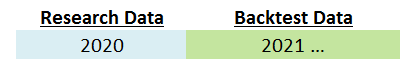

In [ ]:
#@title Choose the research and test period
Research_StartDate = '2020-01-01' #@param {type:"date"}
Research_EndDate = '2020-12-31' #@param {type:"date"}

Test_StartDate = '2021-01-01' #@param {type:"date"}
Test_EndDate = '2021-12-31' #@param {type:"date"}

# Combine the stocks closes into one pandas data frame
print(type(stocksDownload)) # stocksDownload is a list consists of dataframes.
closes = [stock['Close'] for stock in stocksDownload]
stockCloses = pd.concat(closes, axis=1) # list -> panda.dataframe
print(type(stockCloses))
stockCloses.columns = columnNames # add columns

# To prevent lookahead bias, split the data into research period and test period
# The Pairs identification and the trading parameters (Entry / Exit) calculations will be based on research period
# Data in test period to for backtesting
researchData = stockCloses.loc[Research_StartDate : Research_EndDate]
testData = stockCloses.loc[Test_StartDate : Test_EndDate]

# Export the data to csv file for downloading
#researchData.to_csv(RESEARCH_AJD_CLOSE_FILE, encoding='utf_8_sig')
#testData.to_csv(TEST_AJD_CLOSE_FILE, encoding='utf_8_sig')

### In case the Yahoo stock download failed, read from the prepared csv file
#researchData = pd.read_csv('https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/' + RESEARCH_AJD_CLOSE_FILE, index_col=0)
#testData = pd.read_csv('https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/' + TEST_AJD_CLOSE_FILE, index_col=0)
#columnNames = list(researchData.columns)

researchData

<class 'list'>
<class 'pandas.core.frame.DataFrame'>


,阿里巴巴-SW,騰訊控股,建設銀行,美團點評-W,中國移動,友邦保險,滙豐控股,中國平安,香港交易所,工商銀行,...,香港電視,中船防務,光大證券,中國動向,福萊特玻璃,東陽光藥,遠大住工,FI二南方恒指,FL二南方恒指,領展房產基金
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,209.407410,343.260712,4.553010,103.500000,45.920452,76.653542,49.017086,72.859024,229.854584,4.117129,...,3.386446,5.616045,5.374845,0.673176,4.910579,21.673248,8.035072,6.120,10.400,60.791218
2020-01-03,211.401779,343.799286,4.499444,104.199997,45.252899,77.106056,48.614647,73.442528,235.327301,4.083103,...,3.347297,5.606639,5.399462,0.673176,4.901401,20.329361,7.978421,6.170,10.320,60.384956
2020-01-06,210.404602,338.772461,4.452576,109.500000,45.147499,76.291565,48.292698,73.014626,237.092697,4.035467,...,3.337509,5.644267,5.415874,0.657700,4.892221,20.280495,7.761257,6.270,10.160,59.941776
2020-01-07,212.000076,346.133179,4.425793,110.400002,44.831287,77.196564,48.212212,72.820129,238.151932,4.021856,...,3.484320,5.597231,5.415874,0.657700,5.231832,20.329361,7.695163,6.240,10.180,59.830967
2020-01-08,210.205170,342.901672,4.392315,106.400002,44.866421,75.839066,47.729282,71.925438,236.739624,3.974220,...,3.454958,5.907667,5.235344,0.657700,5.231832,20.036150,7.685722,6.330,10.040,59.609375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24,227.954941,501.956390,4.027772,278.200012,33.044525,84.011948,32.356106,73.804260,372.489014,3.271055,...,10.864033,7.102370,5.296834,0.663977,28.259993,9.020000,18.740000,5.435,8.760,53.063732
2020-12-28,209.407410,467.292114,4.112866,260.000000,33.863197,87.560448,32.195129,74.525085,373.571320,3.429565,...,10.766158,6.876599,5.296834,0.621954,28.536146,8.970000,18.600000,5.460,8.715,53.910908
2020-12-29,221.373566,477.646362,4.176686,273.399994,33.230583,86.823090,32.396347,74.805412,372.669373,3.530434,...,10.746584,6.914227,5.379596,0.638763,26.925236,9.010000,17.299999,5.365,8.865,54.604050


Dropdown(description='Stock A:', options=('阿里巴巴-SW', '騰訊控股', '建設銀行', '美團點評-W', '中國移動', '友邦保險', '滙豐控股', '中國平安',…

Dropdown(description='Stock B:', index=1, options=('阿里巴巴-SW', '騰訊控股', '建設銀行', '美團點評-W', '中國移動', '友邦保險', '滙豐控股'…

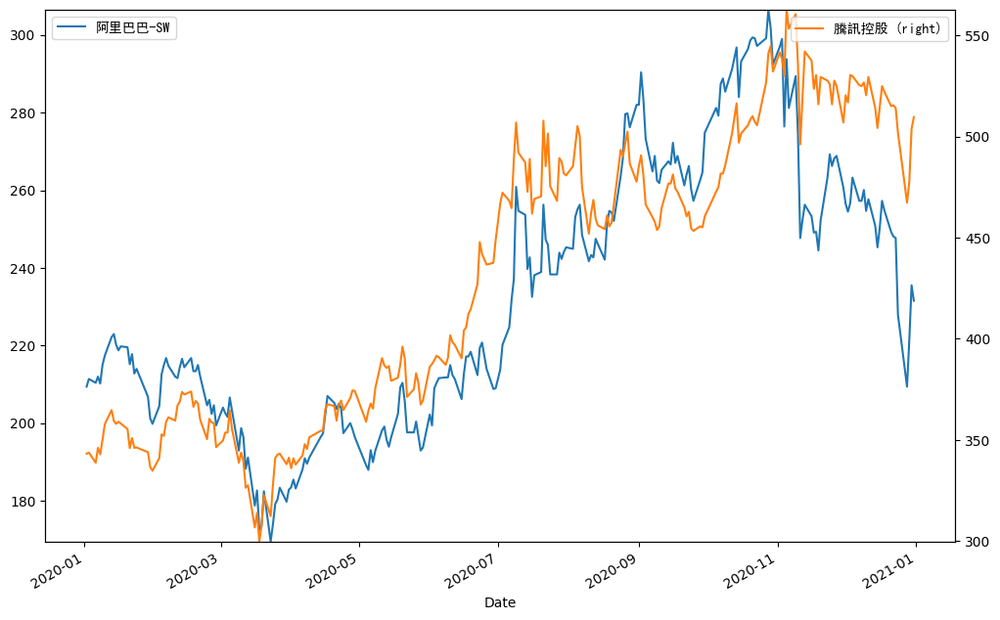

In [ ]:
#@title Pick 2 stocks to display the price correlation in the research period

def dropdown_eventhandler(change):
    clear_output()
    display(stockADropdown)
    display(stockBDropdown)
    plotPair(researchData, stockADropdown.value, stockBDropdown.value, CHART_SIZE_X, CHART_SIZE_Y)

# Drop down list for the stock names
stockADropdown = widgets.Dropdown(
    description="Stock A:",
    options=columnNames
)
display(stockADropdown)
stockADropdown.observe(dropdown_eventhandler)

stockBDropdown = widgets.Dropdown(
    description="Stock B:",
    options=columnNames,
    value = columnNames[1]
)
display(stockBDropdown)
stockBDropdown.observe(dropdown_eventhandler)

plotPair(researchData, stockADropdown.value, stockBDropdown.value, CHART_SIZE_X, CHART_SIZE_Y)

#4. Pair Identifications and Selections


*   Quantify the price correlation for all stock Pair combinations
*   Using the [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient)
*   The value is between 1 to -1 (**1**: perfectly positive correlated; **0**: No correlation; **-1**: perfectly negative correlated)

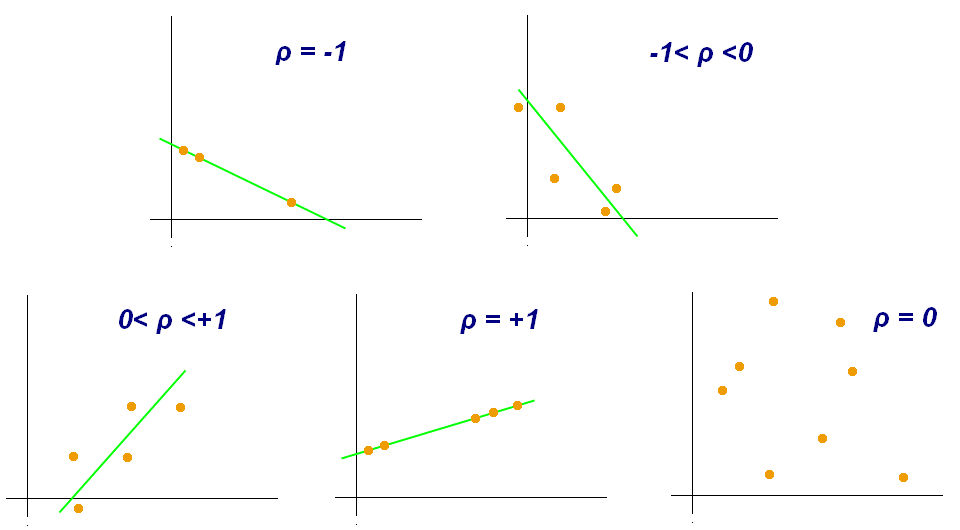

In [ ]:
#@title Run the price correlation for all stock Pair combinations in research period
stocksCorr = researchData.corr()
stocksCorr.style.background_gradient(cmap='coolwarm', axis=None)

In [ ]:
stocksCorr_1 = researchData.corr(method='spearman') # assignment
stocksCorr_1.style.background_gradient(cmap='coolwarm', axis=None)

29929


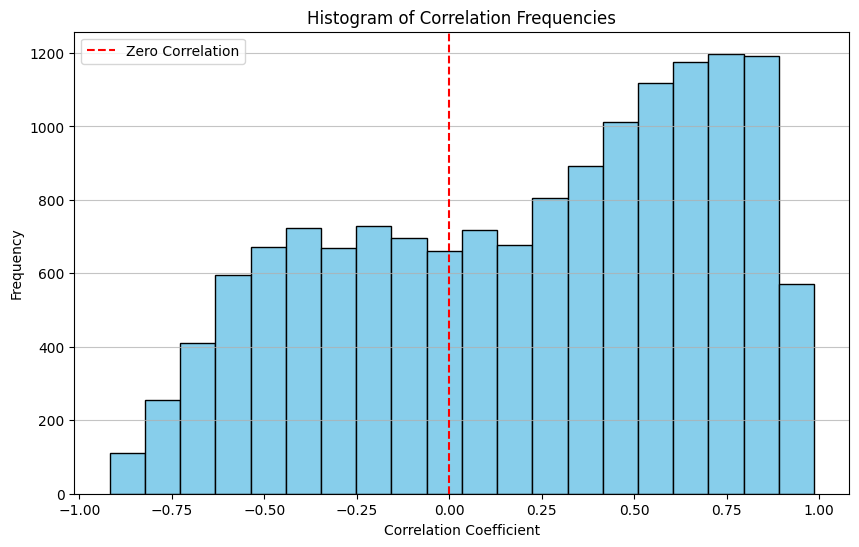

In [ ]:
from ctypes import sizeof
#@title Plot the histogram of correlation frequencies among those stock pairs

# Flatten the correlation matrix and filter out self-correlations
correlation_values = stocksCorr.values.flatten() # dataframe -> ndarray -> ndarray.flatten, 3D -> 1D
print(len(correlation_values))
correlation_values = correlation_values[correlation_values != 1]  # remove self-correlation
correlation_values = np.unique(correlation_values) # remove the duplicated pair correlation

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist(correlation_values, bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Frequencies')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.axvline(x=0, color='red', linestyle='--', label='Zero Correlation')
plt.legend()
plt.show()

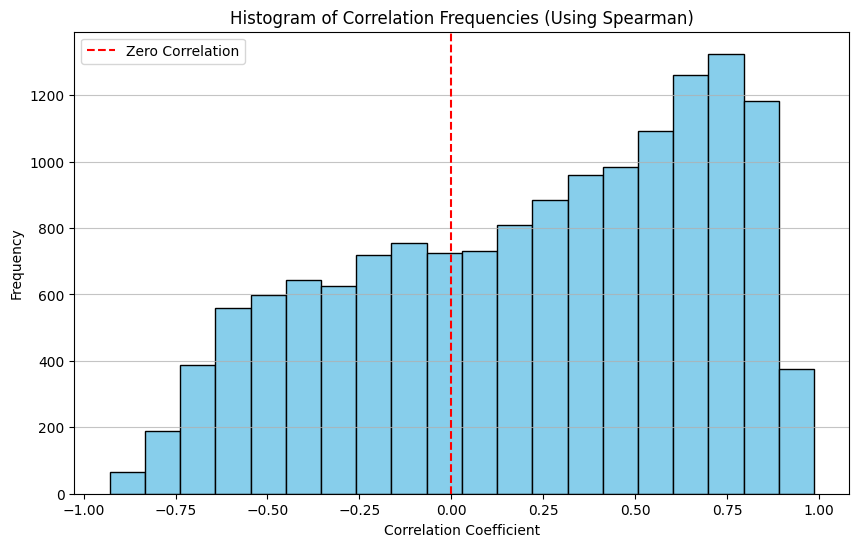

In [ ]:
#@title Plot the histogram of correlation frequencies among those stock pairs

# Flatten the correlation matrix and filter out self-correlations
correlation_values_1 = stocksCorr_1.values.flatten()
correlation_values_1 = correlation_values_1[correlation_values_1 != 1]  # remove self-correlation
correlation_values_1 = np.unique(correlation_values_1) # remove the duplicated pair correlation

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist(correlation_values_1, bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Frequencies (Using Spearman)')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.axvline(x=0, color='red', linestyle='--', label='Zero Correlation')
plt.legend()
plt.show()

Pairs correlation distribution is left skewed. This means that more data points are concentrated on the right (i.e. having **more positive correlated pairs than the negative ones**). It is because the **stocks tends to move togehter with the board market direction**. It is another good exercise to study the highly negative correlated pairs

In [ ]:
#@title Filter the pairs with correlation values larger than the THRESHOLD

THRESHOLD = 0.9 #@param {type:"slider", min:0.5, max:1, step:0.01}
Same_Sector = False #@param {type:"boolean"}
Spearman = False #@param {type:"boolean"}

if Spearman is False:
  stocksCorr_choice = stocksCorr
else:
  stocksCorr_choice = stocksCorr_1

pairsDf = getCorrelatedPairs(stocksCorr_choice, THRESHOLD)

if Same_Sector:
  displayPairsDf = pairsDf[(pairsDf.sameSector == True)]
else:
  displayPairsDf = pairsDf

displayPairsDf.round(4)

,stockA,stockB,corr,sector_A,sector_B,sameSector
0,福萊特玻璃,信義光能,0.9868,玻璃股,光伏太陽能,False
1,美東汽車,美團點評-W,0.9813,汽車銷售,電子商貿及互聯網,False
2,紫金礦業,敏華控股,0.9769,貴金屬,家品,False
3,騰訊控股,中升控股,0.9738,網遊及手遊,汽車銷售,False
4,信義玻璃,信義光能,0.9733,玻璃股,光伏太陽能,False
...,...,...,...,...,...,...
468,創科實業,合景泰富集團,0.9002,機械設備,地產發展,False
469,中船防務,中信建投証券,0.9002,造船相關,其他金融服務,False
470,比亞迪電子,恒騰網絡,0.9002,手機相關,光伏太陽能,False
471,福萊特玻璃,美東汽車,0.9001,玻璃股,汽車銷售,False


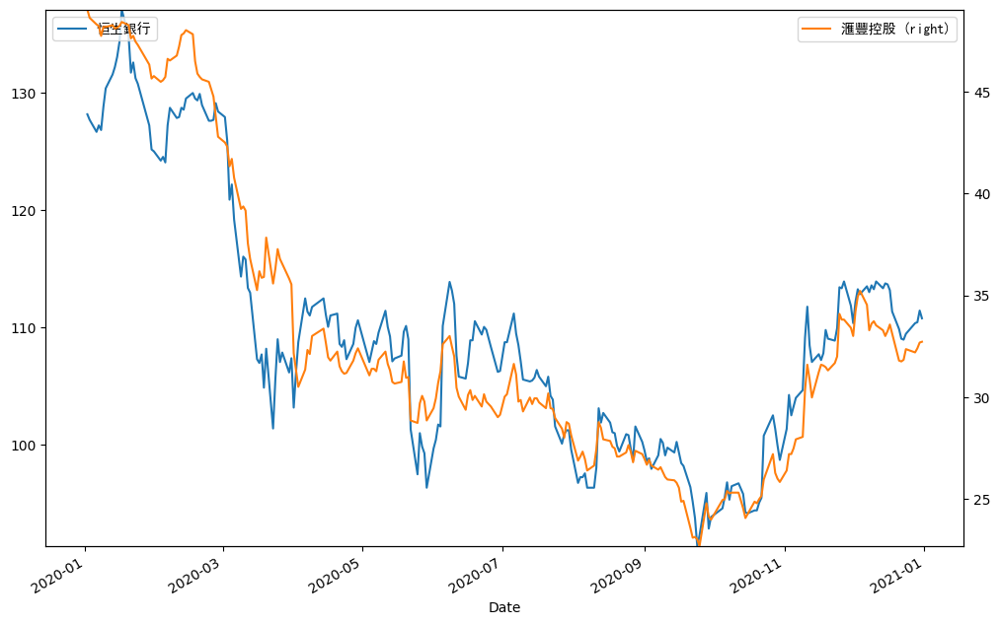

In [ ]:
# Pick a stock pair price chart to to show the price correlation
selected_pair = 34


PAIR_STOCK_A = pairsDf.loc[selected_pair]['stockA']
PAIR_STOCK_B = pairsDf.loc[selected_pair]['stockB']
plotPair(researchData, PAIR_STOCK_A, PAIR_STOCK_B, CHART_SIZE_X, CHART_SIZE_Y)


#5. Determine Trading Parameters (Entry/Exit Point) in **Research Period**
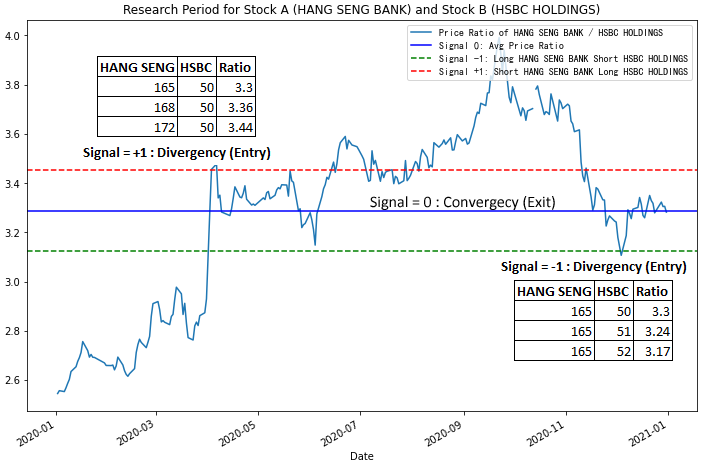

* **Price Ratio of Stock A/B**: the price relationship of stock A and B (Stock A price/ Stock B price) and it captures the **relative value**
* **Average Price Ratio of Stock A/B**: the average price ratio of the stock pair over the **research period** which represents **their long-term relationship**

* **Threshold**: define the **Divergence boundary** for trade **entry** points

* **Entry Point** (Divergence)

 * **Signal -1: Long *under-value* Stock A and Short *over-value* Stock B** when the price ratio **drops below the divergence threshold** than the average price ratio. It happens when stock A drops relatively more than stock B or stock A rises relatively less than stock B. Hence stock A is now relatively under-value to stock B

 * **Signal +1: Short *over-value* Stock A and Long *under-value* Stock B** when price ratio **rises above the divergence theshold** than the average price ratio. It happens when stock A drops relatively less than stock B or stock A rises relatively more than stock B. Hence stock A is now relatively over-value to stock B

* **Exit Point** (Convergence)

 * **Signal 0: Rewind the Position** if already created the above long/short positions, **reverse the above trade to close out the positions** when the stock pair price ratio **reverse back to the average price ratio**


In [ ]:
#@title Calculate the stock price ratios of (Stock A / Stock B) which represent the relative price value over the research period

pairResearchData = researchData[[PAIR_STOCK_A, PAIR_STOCK_B]].copy()

AB_stock = PAIR_STOCK_A + " / " + PAIR_STOCK_B
pairResearchData[AB_stock] = pairResearchData[PAIR_STOCK_A] / pairResearchData[PAIR_STOCK_B]

pairResearchData[[PAIR_STOCK_A, PAIR_STOCK_B, AB_stock]]

,恒生銀行,滙豐控股,恒生銀行 / 滙豐控股
Date,,,
2020-01-02,128.185165,49.017086,2.615112
2020-01-03,127.710968,48.614647,2.627006
2020-01-06,126.683563,48.292698,2.623245
2020-01-07,127.236786,48.212212,2.639099
2020-01-08,126.841644,47.729282,2.657523
...,...,...,...
2020-12-24,109.446762,32.356106,3.382569
2020-12-28,110.357407,32.195129,3.427767
2020-12-29,110.440224,32.396347,3.409033


<class 'dict'>
Average BUY/SELL price ratio of 恒生銀行 / 滙豐控股 in research period: 3.3905187734722073
Threadhold %: 5
Entry Point (Divergence) Signal -1 (Long A Short B): Long 恒生銀行 and Short 滙豐控股 when the BUY/SELL price ratio < 3.2209928347985968
Entry Point (Divergence) Signal +1 (Short A Long B): Short 恒生銀行 and Long 滙豐控股 when the BUY/SELL price ratio > 3.560044712145818
Exit Poiont (Convergence) Signal 0: Unwind the open Long/Short positions at average price ratio:  3.3905187734722073


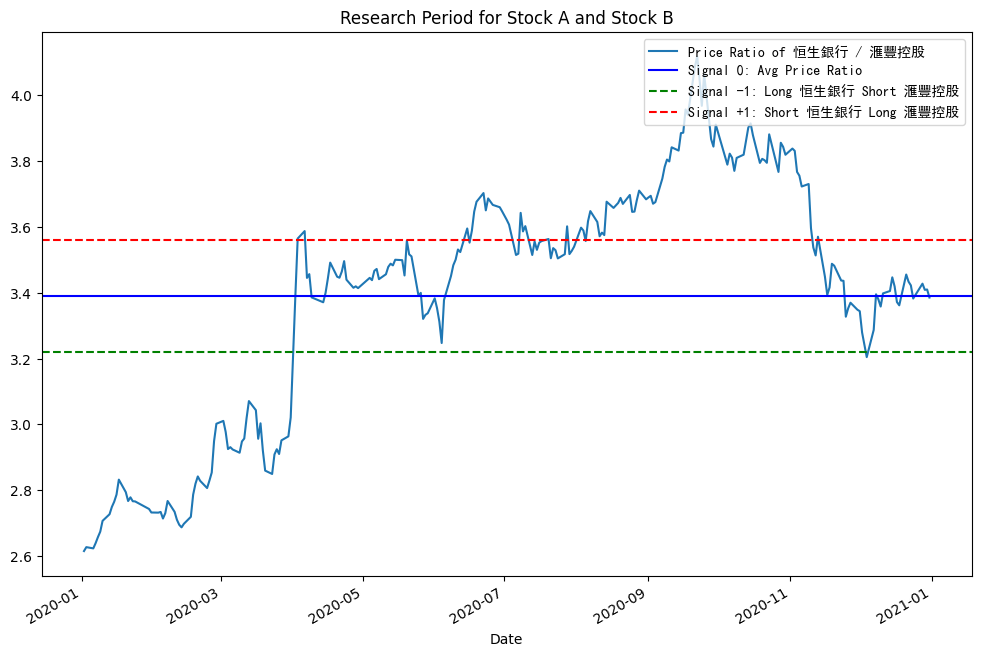

In [ ]:
#@title Calculate the trading parameters based on the Threadshold % in the research period
Threshold_percent = 5 #@param {type:"slider", min:0, max:100, step:1}
PX_RATIO_THRESHOLD = Threshold_percent / 100
tradingParams = researchTradingParams(pairResearchData, PAIR_STOCK_A, PAIR_STOCK_B, PX_RATIO_THRESHOLD)
print(type(tradingParams)) # a dictionary contains ratio and entry points
avgPxRatio = tradingParams['avgPxRatio'] # mean of A/B
longA_shortB_ratio = tradingParams['longA_shortB_ratio'] # avgPxRatio*(1-threshold)
shortA_longB_ratio = tradingParams['shortA_longB_ratio'] # avgPxRatio*(1+threshold)

print("Average BUY/SELL price ratio of", AB_stock, "in research period:", avgPxRatio)
print("Threadhold %:", Threshold_percent)

# Plot the averge price ratio in research period
#labelTitle = 'Research Period for Stock A ({}) and Stock B ({})'.format(PAIR_STOCK_A, PAIR_STOCK_B)
labelTitle = 'Research Period for Stock A and Stock B'
labelPriceRatio = 'Price Ratio of {} / {}'.format(PAIR_STOCK_A, PAIR_STOCK_B)
pairResearchData[AB_stock].plot(title=labelTitle, label=labelPriceRatio, legend=True, figsize=(CHART_SIZE_X, CHART_SIZE_Y))

labelAvgPrice = 'Signal 0: Avg Price Ratio '
plt.axhline(y=avgPxRatio, label=labelAvgPrice, color='b', linestyle='-')
plt.legend(loc ='upper right')

labelLongAShortB = 'Signal -1: Long ' + PAIR_STOCK_A + ' Short ' + PAIR_STOCK_B
plt.axhline(y=longA_shortB_ratio, label=labelLongAShortB, color='g', linestyle='--')

labelShortALongB = 'Signal +1: Short ' + PAIR_STOCK_A + ' Long ' + PAIR_STOCK_B
plt.axhline(y=shortA_longB_ratio, label=labelShortALongB, color='r', linestyle='--')

plt.legend(loc ='upper right', prop=CNFont)

print("Entry Point (Divergence) Signal -1 (Long A Short B): Long", PAIR_STOCK_A, "and Short", PAIR_STOCK_B, "when the BUY/SELL price ratio <", longA_shortB_ratio)
print("Entry Point (Divergence) Signal +1 (Short A Long B): Short", PAIR_STOCK_A, "and Long", PAIR_STOCK_B, "when the BUY/SELL price ratio >", shortA_longB_ratio)
print("Exit Poiont (Convergence) Signal 0: Unwind the open Long/Short positions at average price ratio: ", avgPxRatio)

#6. Backtesting in **test period** and Calculate PnL
Backtest the strategy in the **test period** with the **trading parameters from research period**


* **Mark the signals (+1, -1, 0)** according to the Pair price ratio and the convergence / divengence threshold
* When (signal = +/-1), **enter the trade** by using the specified dollarValue to create positions (e.g. create \$10,000 long on Stock A and \$10,000 short positions on Stock B at the same time). Assume the execution is perfect and can long/short at equal dollar amount
* When (signal = 0), **exit the trade** by unwinding the open long/short positions (i.e. sell the long position and cover the short)
* **StopLoss** when the Pair price ratio is too much further away from the divergence. It could mean the underlying relationship of this Pair is brokern and needs to exit the trade with loss


Calculate the PnL


*   **Trading PnL**: when enter and exit the positions, calculate the profit or loss from the stocks execution price
*   **Trading cost**: based on the annual **short interest rate** and the **transaction cost** of buying and selling the stocks


Entry Point (Divergence) Signal == -1 (Long A Short B): Long 恒生銀行 and Short 滙豐控股 when the BUY/SELL price ratio < 3.2209928347985968
Entry Point (Divergence) Signal == 1 (Short A Long B): Short 恒生銀行 and Long 滙豐控股 when the BUY/SELL price ratio > 3.560044712145818
Exit Poiont (Convergence) Signal == 0 : Within the above range or Unwind the open Long/Short positions at average price ratio:  3.3905187734722073
------------------------------------------------------------------------------------------------------------
                  恒生銀行       滙豐控股   pxRatio  dollarValue  signal
Date                                                            
2021-01-04  113.420616  32.557323  3.483721        10000       0
2021-01-05  114.414085  32.315865  3.540493        10000       0
2021-01-06  114.496880  33.402447  3.427799        10000       0
2021-01-07  119.878151  34.931721  3.431785        10000       0
2021-01-08  122.113434  34.931721  3.495775        10000       0
...                ...     

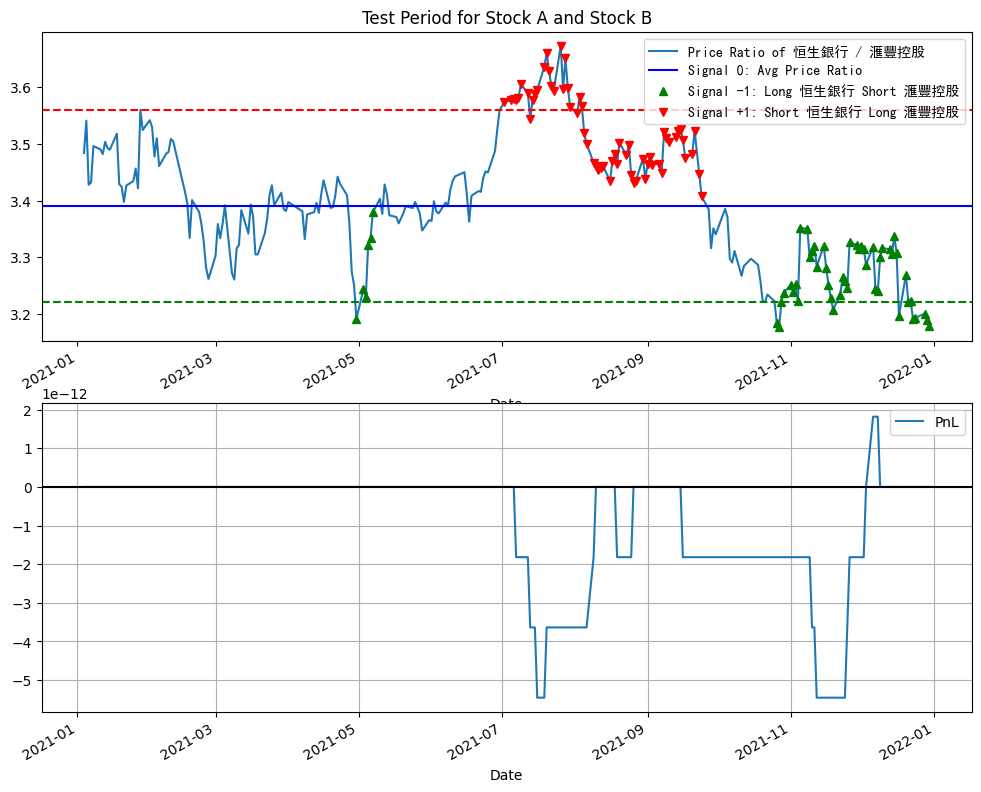

In [28]:
#@title Run back testing with different parameters

dollarValue = 10000 #@param {type:"number"}
stopLossPercent = 0 #@param {type:"slider", min:0, max:50, step:1}
shortInterestPercent = 3 #@param {type:"slider", min:0, max:20, step:0.01}
transactionPercent = 0.5 #@param {type:"slider", min:0, max:20, step:0.01}

print("Entry Point (Divergence) Signal == -1 (Long A Short B): Long", PAIR_STOCK_A, "and Short", PAIR_STOCK_B, "when the BUY/SELL price ratio <", tradingParams['longA_shortB_ratio'])
print("Entry Point (Divergence) Signal == 1 (Short A Long B): Short", PAIR_STOCK_A, "and Long", PAIR_STOCK_B, "when the BUY/SELL price ratio >", tradingParams['shortA_longB_ratio'])
print("Exit Poiont (Convergence) Signal == 0 : Within the above range or Unwind the open Long/Short positions at average price ratio: ", tradingParams['avgPxRatio'])
print("------------------------------------------------------------------------------------------------------------")

# Backtest a Pair in test period
stopLoss = stopLossPercent / 100
backTest_df = backTest(testData, tradingParams, PAIR_STOCK_A, PAIR_STOCK_B, dollarValue, stopLoss)

# Calcuate the PnL in test period
shortInterest = shortInterestPercent / 100
transaction = transactionPercent / 100

print(backTest_df)

def calcPnl(backTest_df, interestRate=0.03, commRate=0.005):
	dailyInterestRate = interestRate / TRADING_DAYS_IN_YEARS
	pnl_df = backTest_df.copy()

	pnl_df[['longPos', 'shortPos', 'longValue', 'shortValue', 'longPnl', 'shortPnl', 'shortInterest', 'transCost', 'pnl', 'totalPnl']] = 0
	signal, longPos, shortPos, longValue, shortValue, longPnl, shortPnl, shortInterest, transCost, pnl, accumPnl, totalPnl = 0, 0, 0, 0, 0, 0, 0 ,0, 0, 0, 0, 0

	for index, row in pnl_df.iterrows():
		currentSignal = row['signal']
		transCost = 0

		# When trading signal is changed
		if currentSignal != signal:
			if currentSignal == 0:
				transCost = (curentLongValue + curentShortValue) * commRate
				longValue = 0
				shortValue = 0

			else:
				longValue = row['dollarValue']
				shortValue = row['dollarValue']
				transCost = (longValue + shortValue) * commRate
		print(row)
		print(row[0])
		print(row[1])
		longPos = getLongPos(currentSignal, longValue, row) # if signal == -1, longPos = longValue/row[0]. if == 1, /row[1]
		shortPos = getShortPos(currentSignal, shortValue, row)


		longPnl = 0
		shortPnl = 0

		pnl = 0
		accumPnl = totalPnl

		#Store current row value
		pnl_df.loc[index, 'transCost'] = transCost

		pnl_df.loc[index, 'longPos'] = longPos
		pnl_df.loc[index, 'shortPos'] = shortPos

		curentLongValue = getLongValue(currentSignal, longPos, row) # if signal == -1, longPos * row[0]. if == 1, *row[1]
		pnl_df.loc[index, 'longValue'] = curentLongValue

		curentShortValue = getShortValue(currentSignal, shortPos, row)
		pnl_df.loc[index, 'shortValue'] = curentShortValue

		currentLongPnl = curentLongValue - longValue
		pnl_df.loc[index, 'longPnl'] = currentLongPnl

		currentShortPnl = shortValue - curentShortValue
		pnl_df.loc[index, 'shortPnl'] = currentShortPnl

		if curentShortValue > 0:
			curentShortInterest = row['dollarValue'] * dailyInterestRate
		else:
			curentShortInterest = 0

		pnl_df.loc[index, 'shortInterest'] = curentShortInterest

		currentPnl = currentLongPnl + currentShortPnl
		pnl_df.loc[index, 'pnl'] = currentPnl

		totalPnl = accumPnl + currentPnl
		pnl_df.loc[index, 'totalPnl'] = totalPnl

		signal = currentSignal

	tradingPnL = pnl_df['totalPnl'].iloc[-1]

	stats = {}
	stats['tradingPnL'] = tradingPnL
	stats['shortInterest'] = pnl_df['shortInterest'].sum()
	stats['transCost'] = pnl_df['transCost'].sum()

	return stats, pnl_df















pnl, pnl_df = calcPnl(backTest_df, shortInterest, transaction)
print(pnl)
print("*** PnL: {}".format(pnl['tradingPnL'] - pnl['shortInterest'] - pnl['transCost']))
print("==================================")
#cols = [PAIR_STOCK_A, PAIR_STOCK_B, 'pxRatio', 'signal', 'longValue', 'shortValue', 'longPos', 'shortPos', 'longPnl', 'shortPnl', 'pnl', 'totalPnl']
#pnl_df[cols].round(4)


# Plot the backtest and PnL results
pnl_df = addSignalMarker(pnl_df)
fig, axes = plt.subplots(2, 1)

#labelTitle = 'Test Period for Stock A ({}) and Stock B ({})'.format(PAIR_STOCK_A, PAIR_STOCK_B)
labelTitle = 'Test Period for Stock A and Stock B'
pnl_df.pxRatio.plot(ax=axes[0], title=labelTitle, label=labelPriceRatio, legend=True)
axes[0].axhline(y=avgPxRatio, label=labelAvgPrice, color='b', linestyle='-')
pnl_df.nSignal.plot(ax=axes[0], label=labelLongAShortB, color='g', linestyle='None', marker='^', legend=True)
pnl_df.pSignal.plot(ax=axes[0], label=labelShortALongB, color='r', linestyle='None', marker='v', legend=True)

axes[0].axhline(y=longA_shortB_ratio, color='g', linestyle='--')
axes[0].axhline(y=shortA_longB_ratio, color='r', linestyle='--')
axes[0].legend(loc ='upper right', prop=CNFont)

pnl_df.totalPnl.plot(ax=axes[1], label='PnL', legend=True, figsize=(CHART_SIZE_X, 10), grid=True)
axes[1].axhline(y=0, color='black', linestyle='-')


In [ ]:
#@title Run the entire Pair portfolio PnL

Same_Sector = True #@param {type:"boolean"}

# Selects the Pairs with same sectors into the portfolio
selectedPairsDf = pairsDf[(pairsDf.sameSector == Same_Sector)]
print("Total pairs for backtesting:", len(selectedPairsDf))
print('----------------------------------------------------------')

# Research the trading params and back test the selected Pairs in test period
pairsPortfolioBackTest = researchAndBackTestPortfolio(selectedPairsDf, researchData, testData, PX_RATIO_THRESHOLD, dollarValue, stopLoss, printOutput=False)

# Calcuate the PnL of the Pairs portfolio
pnl, pnlDf = calcPortfolio(pairsPortfolioBackTest,shortInterest, transaction)
pnlDf

Total pairs for backtesting: 25
----------------------------------------------------------
信義玻璃 vs 福萊特玻璃 ---> $-916.7725393994189
藥明生物 vs 康龍化成 ---> $799.5671525802295
美東汽車 vs 中升控股 ---> $-1948.901960118541
中國銀行 vs 工商銀行 ---> $-752.6818880045537
恒生銀行 vs 滙豐控股 ---> $367.93268638847235
安踏體育 vs 李寧 ---> $-7560.532364444135
永升生活服務 vs 碧桂園服務 ---> $769.0886292343905
比亞迪股份 vs 長城汽車 ---> $668.6704805254058
中海油 vs 中國石油股份 ---> $-2620.243748604776
中國聯通 vs 中國電信 ---> $-2041.472554383721
金沙中國有限公司 vs 永利澳門 ---> $-791.4972316157618
中國有贊 vs 美團點評-W ---> $-4692.326938752768
中國太平 vs 中國人民保險集團 ---> $-1528.6322481813463
中國石油股份 vs 中石化 ---> $-951.3652307901345
威高股份 vs 微創醫療 ---> $-1122.6701490248697
中信建投証券 vs 香港交易所 ---> $-2648.424079875933
美團點評-W vs 閱文集團 ---> $1624.8208835211221
工商銀行 vs 農業銀行 ---> $411.93326147535896
金蝶國際 vs 金山軟件 ---> $-1074.4838097679174
中國銀河 vs 中信証券 ---> $-843.9678339334333
中國平安 vs 中國太保 ---> $-1073.872841944667
建設銀行 vs 農業銀行 ---> $353.89575595587826
金山軟件 vs 心動公司 ---> $1225.4395331013588
康希諾生物-B vs 平安好醫

,stockA,stocksB,tradingPnL,shortInterest,transCost,Pnl
0,信義玻璃,福萊特玻璃,-34.095401,283.593750,599.083388,-916.772539
1,藥明生物,康龍化成,3537.864257,207.421875,2530.875229,799.567153
2,美東汽車,中升控股,-1560.620710,288.281250,100.000000,-1948.901960
3,中國銀行,工商銀行,-158.689331,278.906250,315.086307,-752.681888
4,恒生銀行,滙豐控股,991.382385,132.421875,491.027824,367.932686
5,安踏體育,李寧,-6604.918753,264.843750,690.769861,-7560.532364
6,永升生活服務,碧桂園服務,1581.573759,283.593750,528.891380,769.088629
7,比亞迪股份,長城汽車,1615.495148,277.734375,669.090292,668.670481
8,中海油,中國石油股份,-1824.732834,275.390625,520.120289,-2620.243749
9,中國聯通,中國電信,-1460.727539,284.765625,295.979390,-2041.472554


# Notes
---
### **Pair Identifications and Selections**

Ideal properties of the pairs:

1. The pairs constituents are cointegrated.
2. The pairs reveals a mean-reverting character.
3. The pairs diverges and converges within convenient periods.
4. The pairs reverts to the mean with enough frequency.

This code uses the adjusted closing price and pandas default corr function (Pearson correlation coefficient) to determine the pairs correlations. However, it is generally more desirable to use **co-integration rather than correlation**.



* http://epchan.blogspot.com/2006/11/cointegration-is-not-same-as.html
* https://blog.quantinsti.com/pairs-trading-basics/
* https://kidquant.com/project/pairs-trading-strategies-in-python/


Pairs with stocks in the same sector share the same macro fundamental factors and prevent spurious correlation. However, it may be too restrictive and excludes some pairs opportunities. For example, "Photovoltaic Solar" and "Glass strands" may be correlated (upstream/downstream in the industry) but they're in different sectors

Use **clustering alogrithms** (such as k-mean or DBScan) to group similar stocks together and trade Pairs with the stocks from the same cluster

* https://blog.quantinsti.com/k-means-clustering-pair-selection-python/
* https://algotrading101.com/learn/cluster-analysis-guide/


---

### **Trading Parameters**
* Stocks Price relationship can be expressed as **price spread** (Stock Price A - Stock Price B) rathan than price ratio (Stock Price A / Stock Price B)

* The average price ratio (arithmetic average over a period) can be replaced by other calculations such as short term **moving average**

* **Improve strategy entry /exit points**: there's no guarantee that the point immediately after crossing the threshold is an optimal entry point. The spread might continue to diverge before converging again.

Can apply **statistical measures** (e.g. diverges by more than two historical standard deviations) or **technincal indicators** (e.g. bollinger bands) or **Machine Learning** (e.g. decision tree, LSTM) to predict the price movements and the entry/exit bands

* **Dynamic Stop Loss:** prevent the stocks pair from diverging too much (may be the underlying relationship is broken due to some external events)

* **Position sizing:** dollar value for each pair trade can be different but need a way to determine the optimal amount
